## Маркетинговый анализ приложения Procrastinate Pro+

**Описание проекта**

Развлекательное приложение Procrastinate Pro+, несмотря на огромные вложения в рекламу, последние несколько месяцев компания терпит убытки. 

Наша задача — разобраться в причинах и помочь компании выйти в плюс.

Есть данные о пользователях, привлечённых с 1 мая по 27 октября 2019 года:

- лог сервера с данными об их посещениях
- выгрузка их покупок за этот период
- рекламные расходы.

Нам предстоит изучить:

- откуда приходят пользователи и какими устройствами они пользуются
- сколько стоит привлечение пользователей из различных рекламных каналов
- сколько денег приносит каждый клиент
- когда расходы на привлечение клиента окупаются
- какие факторы мешают привлечению клиентов.

### Загрузите данные и подготовьте их к анализу

#### Изучение данных из файла

In [1]:
# импортируем библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly  
import plotly.graph_objs as go
import plotly.express as px 
from plotly.subplots import make_subplots

In [2]:
 # импортируем функции для работы со временем
from datetime import datetime, timedelta

In [3]:
# зададим параметры визуализации
sns.set(
    font_scale =2,
    style      ='whitegrid',
    rc         ={'figure.figsize':(20,7)}
)
%config InlineBackend.figure_format = 'retina'

In [4]:
visits = pd.read_csv('/datasets/visits_info_short.csv')
orders = pd.read_csv('/datasets/orders_info_short.csv')
costs = pd.read_csv('/datasets/costs_info_short.csv')

In [5]:
# получим первые 3 строки таблицы
visits.head(3)

,User Id,Region,Device,Channel,Session Start,Session End
0,981449118918,United States,iPhone,organic,2019-05-01 02:36:01,2019-05-01 02:45:01
1,278965908054,United States,iPhone,organic,2019-05-01 04:46:31,2019-05-01 04:47:35
2,590706206550,United States,Mac,organic,2019-05-01 14:09:25,2019-05-01 15:32:08


In [6]:
# получим первые 3 строки таблицы
orders.head(3)

,User Id,Event Dt,Revenue
0,188246423999,2019-05-01 23:09:52,4.99
1,174361394180,2019-05-01 12:24:04,4.99
2,529610067795,2019-05-01 11:34:04,4.99


In [7]:
# получим первые 3 строки таблицы
costs.head(3)

,dt,Channel,costs
0,2019-05-01,FaceBoom,113.3
1,2019-05-02,FaceBoom,78.1
2,2019-05-03,FaceBoom,85.8


In [8]:
# получение общей информации о данных в таблицах
display(visits.info())
display('-*-')
display(orders.info())
display('-*-')
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309901 entries, 0 to 309900
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   User Id        309901 non-null  int64 
 1   Region         309901 non-null  object
 2   Device         309901 non-null  object
 3   Channel        309901 non-null  object
 4   Session Start  309901 non-null  object
 5   Session End    309901 non-null  object
dtypes: int64(1), object(5)
memory usage: 14.2+ MB


None

'-*-'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40212 entries, 0 to 40211
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   User Id   40212 non-null  int64  
 1   Event Dt  40212 non-null  object 
 2   Revenue   40212 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 942.6+ KB


None

'-*-'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1800 entries, 0 to 1799
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   dt       1800 non-null   object 
 1   Channel  1800 non-null   object 
 2   costs    1800 non-null   float64
dtypes: float64(1), object(2)
memory usage: 42.3+ KB


In [9]:
# подсчёт пропусков в таблице
display(visits.isna().sum())
display(orders.isna().sum())
costs.isna().sum()

User Id          0
Region           0
Device           0
Channel          0
Session Start    0
Session End      0
dtype: int64

User Id     0
Event Dt    0
Revenue     0
dtype: int64

dt         0
Channel    0
costs      0
dtype: int64

In [10]:
# статистические показатели таблиц
display(visits.describe())
display(orders.describe())
costs.describe()

,User Id
count,3.099010e+05
mean,4.997664e+11
std,2.887899e+11
min,5.993260e+05
25%,2.493691e+11
50%,4.989906e+11
75%,7.495211e+11
max,9.999996e+11


,User Id,Revenue
count,4.021200e+04,40212.000000
mean,4.990295e+11,5.370608
std,2.860937e+11,3.454208
min,5.993260e+05,4.990000
25%,2.511324e+11,4.990000
50%,4.982840e+11,4.990000
75%,7.433327e+11,4.990000
max,9.998954e+11,49.990000


,costs
count,1800.000000
mean,58.609611
std,107.740223
min,0.800000
25%,6.495000
50%,12.285000
75%,33.600000
max,630.000000


In [11]:
# количество строк и столбцов
display(visits.shape)
display(orders.shape)
display(costs.shape)

(309901, 6)

(40212, 3)

(1800, 3)

#### Предобработка данных

In [12]:
# заменяем пробелы в названиях столбцов на нижнее подчеркивание
visits.columns = [x.lower().replace(' ', '_') for x in visits.columns]
orders.columns = [x.lower().replace(' ', '_') for x in orders.columns]
costs.columns = costs.columns.str.lower() 

In [13]:
# проверяем дубликаты в таблице
display(visits.duplicated().sum())
display(orders.duplicated().sum())
costs.duplicated().sum()

0

0

0

In [14]:
# уникальные значения столбца
visits.region.value_counts()

United States    207327
UK                36419
France            35396
Germany           30759
Name: region, dtype: int64

In [15]:
# уникальные значения столбца
visits.device.value_counts()

iPhone     112603
Android     72590
PC          62686
Mac         62022
Name: device, dtype: int64

In [16]:
# уникальные значения столбца
costs.channel.value_counts()

TipTop                180
OppleCreativeMedia    180
lambdaMediaAds        180
AdNonSense            180
WahooNetBanner        180
LeapBob               180
MediaTornado          180
FaceBoom              180
RocketSuperAds        180
YRabbit               180
Name: channel, dtype: int64

In [17]:
# переводим значений столбцов из строки в дату
visits['session_start'] = pd.to_datetime(visits['session_start'])
visits['session_end'] = pd.to_datetime(visits['session_end'])
orders['event_dt'] = pd.to_datetime(orders['event_dt'])
costs['dt'] = pd.to_datetime(costs['dt']).dt.date 

In [18]:
# функция для первичного анализа
def description (x,y,z):
    display('Получение первых 5 строк таблицы')
    display(x.head())
    display(y.head())
    display(z.head())
    display('Получение общей информации о данных в таблицах')
    display(x.info())
    display(y.info())
    display(z.info())
    display('Статистические показатели таблиц')
    display(x.describe())
    display(y.describe())
    display(z.describe())
    display('Количество строк и столбцов')
    display(x.shape)
    display(y.shape)
    display(z.shape)
    display('Наличие дубликатов в таблице')
    display(x.duplicated().sum())
    display(y.duplicated().sum())
    display(z.duplicated().sum())
    # преобразование названий столбцов к нижнему регистру и заполнение пробелов на нижнее подчеркивание
    x.columns = [a.lower().replace(' ', '_') for a in x.columns]
    y.columns = [a.lower().replace(' ', '_') for a in y.columns]
    z.columns = [a.lower().replace(' ', '_') for a in z.columns]
    
description(visits, orders, costs)

'Получение первых 5 строк таблицы'

,user_id,region,device,channel,session_start,session_end
0,981449118918,United States,iPhone,organic,2019-05-01 02:36:01,2019-05-01 02:45:01
1,278965908054,United States,iPhone,organic,2019-05-01 04:46:31,2019-05-01 04:47:35
2,590706206550,United States,Mac,organic,2019-05-01 14:09:25,2019-05-01 15:32:08
3,326433527971,United States,Android,TipTop,2019-05-01 00:29:59,2019-05-01 00:54:25
4,349773784594,United States,Mac,organic,2019-05-01 03:33:35,2019-05-01 03:57:40


,user_id,event_dt,revenue
0,188246423999,2019-05-01 23:09:52,4.99
1,174361394180,2019-05-01 12:24:04,4.99
2,529610067795,2019-05-01 11:34:04,4.99
3,319939546352,2019-05-01 15:34:40,4.99
4,366000285810,2019-05-01 13:59:51,4.99


,dt,channel,costs
0,2019-05-01,FaceBoom,113.3
1,2019-05-02,FaceBoom,78.1
2,2019-05-03,FaceBoom,85.8
3,2019-05-04,FaceBoom,136.4
4,2019-05-05,FaceBoom,122.1


'Получение общей информации о данных в таблицах'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309901 entries, 0 to 309900
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   user_id        309901 non-null  int64         
 1   region         309901 non-null  object        
 2   device         309901 non-null  object        
 3   channel        309901 non-null  object        
 4   session_start  309901 non-null  datetime64[ns]
 5   session_end    309901 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(3)
memory usage: 14.2+ MB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40212 entries, 0 to 40211
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   user_id   40212 non-null  int64         
 1   event_dt  40212 non-null  datetime64[ns]
 2   revenue   40212 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 942.6 KB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1800 entries, 0 to 1799
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   dt       1800 non-null   object 
 1   channel  1800 non-null   object 
 2   costs    1800 non-null   float64
dtypes: float64(1), object(2)
memory usage: 42.3+ KB


None

'Статистические показатели таблиц'

,user_id
count,3.099010e+05
mean,4.997664e+11
std,2.887899e+11
min,5.993260e+05
25%,2.493691e+11
50%,4.989906e+11
75%,7.495211e+11
max,9.999996e+11


,user_id,revenue
count,4.021200e+04,40212.000000
mean,4.990295e+11,5.370608
std,2.860937e+11,3.454208
min,5.993260e+05,4.990000
25%,2.511324e+11,4.990000
50%,4.982840e+11,4.990000
75%,7.433327e+11,4.990000
max,9.998954e+11,49.990000


,costs
count,1800.000000
mean,58.609611
std,107.740223
min,0.800000
25%,6.495000
50%,12.285000
75%,33.600000
max,630.000000


'Количество строк и столбцов'

(309901, 6)

(40212, 3)

(1800, 3)

'Наличие дубликатов в таблице'

0

0

0

#### Вывод

Мы проводим исследование данных из 3 таблиц с информацией о:

- посещениях сайта - 6 столбцов, 309 901 строка
- заказах - 3 столбца, 40 212 строк  
- затратах на маркетинг - 3 столбца, 1 800 строк.

Анализ проводится по 4 странам: США, Великобритания, Франция и Германия. 

Категории устройств пользователей: iPhone, Android, PC, Mac.

Названия столбцов имеют заглавные буквы и пробелы. Это неудобно при обработке и анализе данных, поэтому заменим их на строчные буквы и нижнее подчеркивание. Значения столбцов с датами преобразуем из строк в тип datetime64.

Пропуски и дубли значений в таблицах отсутствуют.

### Задайте функции для расчёта и анализа LTV, ROI, удержания и конверсии.

Разрешается использовать функции, с которыми вы познакомились в теоретических уроках.

Это функции для вычисления значений метрик:

- `get_profiles()` — для создания профилей пользователей,
- `get_retention()` — для подсчёта Retention Rate,
- `get_conversion()` — для подсчёта конверсии,
- `get_ltv()` — для подсчёта LTV.

А также функции для построения графиков:

- `filter_data()` — для сглаживания данных,
- `plot_retention()` — для построения графика Retention Rate,
- `plot_conversion()` — для построения графика конверсии,
- `plot_ltv_roi` — для визуализации LTV и ROI.

#### Функция для расчёта LTV и ROI

In [19]:
def get_ltv(
    profiles,
    purchases,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # исключаем пользователей, не «доживших» до горизонта анализа
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')
    # добавляем данные о покупках в профили
    result_raw = result_raw.merge(
        purchases[['user_id', 'event_dt', 'revenue']], on='user_id', how='left'
    )
    # рассчитываем лайфтайм пользователя для каждой покупки
    result_raw['lifetime'] = (
        result_raw['event_dt'] - result_raw['first_ts']
    ).dt.days
    # группируем по cohort, если в dimensions ничего нет
    if len(dimensions) == 0:
        result_raw['cohort'] = 'All users'
        dimensions = dimensions + ['cohort']

    # функция группировки по желаемым признакам
    def group_by_dimensions(df, dims, horizon_days):
        # строим «треугольную» таблицу выручки
        result = df.pivot_table(
            index=dims, columns='lifetime', values='revenue', aggfunc='sum'
        )
        # находим сумму выручки с накоплением
        result = result.fillna(0).cumsum(axis=1)
        # вычисляем размеры когорт
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )
        # объединяем размеры когорт и таблицу выручки
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        # считаем LTV: делим каждую «ячейку» в строке на размер когорты
        result = result.div(result['cohort_size'], axis=0)
        # исключаем все лайфтаймы, превышающие горизонт анализа
        result = result[['cohort_size'] + list(range(horizon_days))]
        # восстанавливаем размеры когорт
        result['cohort_size'] = cohort_sizes

        # собираем датафрейм с данными пользователей и значениями CAC, 
        # добавляя параметры из dimensions
        cac = df[['user_id', 'acquisition_cost'] + dims].drop_duplicates()

        # считаем средний CAC по параметрам из dimensions
        cac = (
            cac.groupby(dims)
            .agg({'acquisition_cost': 'mean'})
            .rename(columns={'acquisition_cost': 'cac'})
        )

        # считаем ROI: делим LTV на CAC
        roi = result.div(cac['cac'], axis=0)

        # удаляем строки с бесконечным ROI
        roi = roi[~roi['cohort_size'].isin([np.inf])]

        # восстанавливаем размеры когорт в таблице ROI
        roi['cohort_size'] = cohort_sizes

        # добавляем CAC в таблицу ROI
        roi['cac'] = cac['cac']

        # в финальной таблице оставляем размеры когорт, CAC
        # и ROI в лайфтаймы, не превышающие горизонт анализа
        roi = roi[['cohort_size', 'cac'] + list(range(horizon_days))]

        # возвращаем таблицы LTV и ROI
        return result, roi

    # получаем таблицы LTV и ROI
    result_grouped, roi_grouped = group_by_dimensions(
        result_raw, dimensions, horizon_days
    )

    # для таблиц динамики убираем 'cohort' из dimensions
    if 'cohort' in dimensions:
        dimensions = []

    # получаем таблицы динамики LTV и ROI
    result_in_time, roi_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    return (
        result_raw,  # сырые данные
        result_grouped,  # таблица LTV
        result_in_time,  # таблица динамики LTV
        roi_grouped,  # таблица ROI
        roi_in_time,  # таблица динамики ROI
    ) 
     

#### Функция для расчёта удержания

In [20]:
def get_retention(
    profiles,
    sessions,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # добавляем столбец payer в передаваемый dimensions список
    dimensions = ['payer'] + dimensions

    # исключаем пользователей, не «доживших» до горизонта анализа
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')

    # собираем «сырые» данные для расчёта удержания
    result_raw = result_raw.merge(
        sessions[['user_id', 'session_start']], on='user_id', how='left'
    )
    result_raw['lifetime'] = (
        result_raw['session_start'] - result_raw['first_ts']
    ).dt.days

    # функция для группировки таблицы по желаемым признакам
    def group_by_dimensions(df, dims, horizon_days):
        result = df.pivot_table(
            index=dims, columns='lifetime', values='user_id', aggfunc='nunique'
        )
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        result = result.div(result['cohort_size'], axis=0)
        result = result[['cohort_size'] + list(range(horizon_days))]
        result['cohort_size'] = cohort_sizes
        return result

    # получаем таблицу удержания
    result_grouped = group_by_dimensions(result_raw, dimensions, horizon_days)

    # получаем таблицу динамики удержания
    result_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    # возвращаем обе таблицы и сырые данные
    return result_raw, result_grouped, result_in_time

#### Функция для расчёта конверсии

In [21]:
def get_conversion(
    profiles,
    purchases,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # исключаем пользователей, не «доживших» до горизонта анализа
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')

    # определяем дату и время первой покупки для каждого пользователя
    first_purchases = (
        purchases.sort_values(by=['user_id', 'event_dt'])
        .groupby('user_id')
        .agg({'event_dt': 'first'})
        .reset_index()
    )

    # добавляем данные о покупках в профили
    result_raw = result_raw.merge(
        first_purchases[['user_id', 'event_dt']], on='user_id', how='left'
    )

    # рассчитываем лайфтайм для каждой покупки
    result_raw['lifetime'] = (
        result_raw['event_dt'] - result_raw['first_ts']
    ).dt.days

    # группируем по cohort, если в dimensions ничего нет
    if len(dimensions) == 0:
        result_raw['cohort'] = 'All users'
        dimensions = dimensions + ['cohort']

    # функция для группировки таблицы по желаемым признакам
    def group_by_dimensions(df, dims, horizon_days):
        result = df.pivot_table(
            index=dims, columns='lifetime', values='user_id', aggfunc='nunique'
        )
        result = result.fillna(0).cumsum(axis=1)
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        # делим каждую «ячейку» в строке на размер когорты
        # и получаем conversion rate
        result = result.div(result['cohort_size'], axis=0)
        result = result[['cohort_size'] + list(range(horizon_days))]
        result['cohort_size'] = cohort_sizes
        return result

    # получаем таблицу конверсии
    result_grouped = group_by_dimensions(result_raw, dimensions, horizon_days)

    # для таблицы динамики конверсии убираем 'cohort' из dimensions
    if 'cohort' in dimensions: 
        dimensions = []

    # получаем таблицу динамики конверсии
    result_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    # возвращаем обе таблицы и сырые данные
    return result_raw, result_grouped, result_in_time

#### Вывод

Созданы функции для расчета и анализа LTV (Lifetime Value, пожизненная ценность), ROI (Return On Investment, окупаемость инвестиций), Retention Rate (коэффициент удержания) и Conversion Rate (коэффициент конверсии).

LTV - общая сумма денег, которую один клиент в среднем приносит компании со всех своих покупок.

ROI - на сколько процентов LTV превысил CAC (Customer Acquisition Cost, стоимость привлечения одного клиента).

Retention Rate показывает, как долго клиенты остаются с компанией.

CR - процент пользователей когорты, совершивших какое-нибудь действие (оплату покупки).

### Исследовательский анализ данных

- Составьте профили пользователей. Определите минимальную и максимальную даты привлечения пользователей.
- Выясните, из каких стран пользователи приходят в приложение и на какую страну приходится больше всего платящих пользователей. Постройте таблицу, отражающую количество пользователей и долю платящих из каждой страны.
- Узнайте, какими устройствами пользуются клиенты и какие устройства предпочитают платящие пользователи. Постройте таблицу, отражающую количество пользователей и долю платящих для каждого устройства.
- Изучите рекламные источники привлечения и определите каналы, из которых пришло больше всего платящих пользователей. Постройте таблицу, отражающую количество пользователей и долю платящих для каждого канала привлечения.

После каждого пункта сформулируйте выводы.

In [22]:
# момент анализа
observation_date = datetime(2019, 11, 1).date()
observation_date

datetime.date(2019, 11, 1)

In [23]:
# горизонт анализа
horizon_days = 14

In [24]:
# создание опции «игнорировать горизонт»
ignore_horizon = False

**Выводы:**

По условиям задачи мы смотрим данные 1 ноября 2019 года. В организации принято считать, что затраты на привлечения пользователей должны окупиться не позднее 2 недель. Таким образом, момент анализа составляет 1 ноября 2019 года, горизонт анализа - 14 дней.

Минимальная дата привлечения пользователей - 1 мая 2019 года. 

Максимальная дата с учетом горизонта - 27 октября 2019 года.
    


In [25]:
# функция создания профилей
def get_profiles(visits, orders, costs):

    # находим параметры первых посещений
    profiles = (
        visits.sort_values(by=['user_id', 'session_start'])
        .groupby('user_id')
        .agg(
            {
                'session_start': 'first',
                'channel': 'first',
                'device': 'first',
                'region': 'first',
            }
        )
        .rename(columns={'session_start': 'first_ts'})
        .reset_index()
    )

    # для когортного анализа определяем дату первого посещения и первый день месяца, в который это посещение произошло
    profiles['dt'] = profiles['first_ts'].dt.date
    profiles['month'] = profiles['first_ts'].astype('datetime64[M]')

    # добавляем признак платящих пользователей
    profiles['payer'] = profiles['user_id'].isin(orders['user_id'].unique())

    # считаем количество уникальных пользователей с одинаковыми источником и датой привлечения
    new_users = (
        profiles.groupby(['dt', 'channel'])
        .agg({'user_id': 'nunique'})
        .rename(columns={'user_id': 'unique_users'})
        .reset_index()
    )

    # объединяем траты на рекламу и число привлечённых пользователей
    costs = costs.merge(new_users, on=['dt', 'channel'], how='left')
    #costs['acquisition_cost'] = costs.set_index('key').join(new_users.set_index('key'))

    # делим рекламные расходы на число привлечённых пользователей
    costs['acquisition_cost'] = costs['costs'] / costs['unique_users']
 

    # добавляем стоимость привлечения в профили
    profiles = profiles.merge(
        costs[['dt', 'channel', 'acquisition_cost']],
        on=['dt', 'channel'],
        how='left',
    )

    # стоимость привлечения органических пользователей равна нулю
    profiles['acquisition_cost'] = profiles['acquisition_cost'].fillna(0)

    return profiles


profiles = get_profiles(visits, orders, costs)
profiles.head()

,user_id,first_ts,channel,device,region,dt,month,payer,acquisition_cost
0,599326,2019-05-07 20:58:57,FaceBoom,Mac,United States,2019-05-07,2019-05-01,True,1.088172
1,4919697,2019-07-09 12:46:07,FaceBoom,iPhone,United States,2019-07-09,2019-07-01,False,1.107237
2,6085896,2019-10-01 09:58:33,organic,iPhone,France,2019-10-01,2019-10-01,False,0.000000
3,22593348,2019-08-22 21:35:48,AdNonSense,PC,Germany,2019-08-22,2019-08-01,False,0.988235
4,31989216,2019-10-02 00:07:44,YRabbit,iPhone,United States,2019-10-02,2019-10-01,False,0.230769


In [26]:
# страны и платящие пользователи
profiles.groupby('region').agg({'user_id': 'nunique', 'payer': ['sum', 'mean']})

user_id payer          
              nunique   sum      mean
region                               
France          17450   663  0.037994
Germany         14981   616  0.041119
UK              17575   700  0.039829
United States  100002  6902  0.069019

**Вывод:**

Пользователи приходят в приложение из 4 стран: США, Великобритания, Франция и Германия.

США значительно лидируют по количеству пользователей приложения ~ 100 000. Доля платящих пользователей также выше в США ~ 7%.

In [27]:
# найдем минимальную и максимальную даты привлечения пользователей

print(f'''Минимальная дата привлечения пользователей: {profiles['dt'].min()}
Максимальная дата привлечения пользователей: {profiles['dt'].max()}''')

Минимальная дата привлечения пользователей: 2019-05-01
Максимальная дата привлечения пользователей: 2019-10-27


In [28]:
#посмотрим, сколько в среднем приносит каждый клиент
orders.groupby('user_id').agg({'revenue': 'sum'}).describe()

,revenue
count,8881.000000
mean,24.317406
std,22.381708
min,4.990000
25%,4.990000
50%,14.970000
75%,39.920000
max,149.880000


Каждый клиент приносит в среднем от 4.99 до 149.9 долларов

In [29]:
# profiles_research - напишем функцию для расчета количества пользователей
# по критерию, а также долю платящих с сортировкой по убыванию этого значения
def profiles_research(df, dimension, index_name):
    result = (
        df
        .groupby(dimension) # группируем по критерию
        .agg({
                'user_id': 'nunique', # считаем уникальных пользователей
                'payer': 'mean' # и долю (среднее) платящих
        }) 
    )
    # вычисляем проценты
    result['payer'] = result['payer'] * 100 
    # переименовываем для удобства названия столбцов и индексов
    result = result.rename({'user_id': 'Кол-во пользователей', 'payer': '% платящих'}, axis=1)
    result.index.name = index_name 
    result = result.sort_values(by='% платящих', ascending=False) # сортируем по убыванию доли платящих
    return result

#### Пользователи в cрезе стран

In [30]:
# сгруппируем пользователей по региону, найдем количество пользователей 
# и долю платящих (среднее значений) и отсортируем по убыванию этого значения
profiles_research(profiles, 'region', 'Регион')

,Кол-во пользователей,% платящих
Регион,,
United States,100002,6.901862
Germany,14981,4.111875
UK,17575,3.982930
France,17450,3.799427


In [31]:
# дополнительно визуализируем:

prof = profiles.groupby('region').agg({
    'user_id': 'nunique',
    'payer': 'sum'
})\
    .sort_values(by='user_id', ascending=False)
fig = go.Figure()
fig.add_trace(go.Bar(x=prof.index, y=prof['user_id'], name='Пользователи', text=prof['user_id']))
fig.add_trace(go.Bar(x=prof.index, y=prof['payer'], name='Платящие пользователи', text=prof['payer']))
fig.update_traces(textfont_size=10)
fig.update_layout(
        title='Пользователи по странам',
        xaxis_title='Страна',
        yaxis_title='Количество пользователей'
    )
fig.show()

#### Пользователи в cрезе устройств

In [32]:
# сгруппируем пользователей по устройствам, найдем количество всех пользователей 
# и долю платящих (среднее значений) и отсортируем по убыванию этого значения
profiles_research(profiles, 'device', 'Устройство')

,Кол-во пользователей,% платящих
Устройство,,
Mac,30042,6.364423
iPhone,54479,6.207897
Android,35032,5.851793
PC,30455,5.046790


In [33]:
# дополнительно визуализируем:

prof = profiles.groupby('device').agg({
    'user_id': 'nunique',
    'payer': 'sum'
})\
    .sort_values(by='user_id', ascending=False)

fig = go.Figure()
fig.add_trace(go.Bar(x=prof.index, y=prof['user_id'], name='Пользователи', text=prof['user_id']))
fig.add_trace(go.Bar(x=prof.index, y=prof['payer'], name='Платящие пользователи', text=prof['payer']))
fig.update_traces(textfont_size=10)
fig.update_layout(
        title='Пользователи по устройствам',
        xaxis_title='Устройство',
        yaxis_title='Количество пользователей'
    )
fig.show()

#### Пользователи по источникам привлечения

In [34]:
profiles_research(profiles, 'channel', 'Канал привлечения')

,Кол-во пользователей,% платящих
Канал привлечения,,
FaceBoom,29144,12.204914
AdNonSense,3880,11.340206
lambdaMediaAds,2149,10.469986
TipTop,19561,9.600736
RocketSuperAds,4448,7.913669
WahooNetBanner,8553,5.296387
YRabbit,4312,3.826531
MediaTornado,4364,3.574702
LeapBob,8553,3.063253


In [35]:
# дополнительно визуализируем:

prof = profiles.groupby('channel').agg({
    'user_id': 'nunique',
    'payer': 'sum'
}) \
    .sort_values(by='user_id', ascending=False)

fig = go.Figure()
fig.add_trace(go.Bar(x=prof.index, y=prof['user_id'], name='Пользователи', text=prof['user_id']))
fig.add_trace(go.Bar(x=prof.index, y=prof['payer'], name='Платящие пользователи', text=prof['payer']))
fig.update_traces(textfont_size=10)
fig.update_layout(
        title='Пользователи по каналам привлечения',
        xaxis_title='Источник',
        yaxis_title='Количество пользователей'
    )
fig.show()

**Выводы:**

- в нашем рапоряжении данные о пользователях, которых привлекали в период с 01.05.2019 по 27.10.2019;
- каждый клиент приносит в среднем от 4.99 до 149.9;
- все пользователи из 4 стран: США, Германия, Франция, Великобритания. Большинство пользователей, в том числе платящих - из США (100002 человек и 6.9% платящих), меньше всего пользователей из Германии, а платящих - из Франции;
- пользователи заходят на сайт, используя Mac, iPhone, Android и PC. Больше всего пользователей заходят с iPhone (54479), больше всего платящих заходят через Mac (6.4%);
- по источникам привлечения (всего 11 источников) больше всего "органических" (56439 человек), но они платят меньше всего (доля - 2%). Больше всего платящих приходят с канала FaceBoom (в абсолютных и относительных - 12.2%) и TipTop (в абсолютных значениях).

Количество рекламных источников привлечения - 10. При этом, больше всего органических пользователей, которые пришли не из рекламных источников - 56,44 тыс. Они же на третьем месте по количеству платящих пользователей в абсолютном выражении - 1,16 тыс. Из рекламных источников наибольшее количество пользователей пришли из FaceBoom и TipTop - 29,14 и 19,56 тыс. соответственно.

Доли платящих пользователей распределены так:

- FaceBoom - 12%
- AdNonSense - 11%
- TipTop - 10%
- lambdaMediaAds - 10%.

Наименьшая доля платящих пользователей у тех, кто не пришел с рекламных источников - всего 2%.

### Маркетинг

- Посчитайте общую сумму расходов на маркетинг.
- Выясните, как траты распределены по рекламным источникам, то есть сколько денег потратили на каждый источник.
- Постройте визуализацию динамики изменения расходов во времени (по неделям и месяцам) по каждому источнику. Постарайтесь отразить это на одном графике.
- Узнайте, сколько в среднем стоило привлечение одного пользователя (CAC) из каждого источника. Используйте профили пользователей.

Напишите промежуточные выводы.

In [36]:
# всего потрачено денег
print(f'''Общая сумма расходов на маркетинг: {round(costs.costs.sum(), 2)}''')

Общая сумма расходов на маркетинг: 105497.3


In [37]:
# потрачено денег на каждый источник
channel_costs_report = pd.DataFrame()
channel_costs_report['costs'] = costs.groupby('channel')['costs'].sum()
channel_costs_report['share'] = ((channel_costs_report['costs'] / costs['costs'].sum()) * 100)
channel_costs_report.sort_values(by='share', ascending=False).style.format({'share': '{:.2f}%', 'payer_share': '{:.2f}%'})

,costs,share
channel,,
TipTop,54751.300000,51.90%
FaceBoom,32445.600000,30.75%
WahooNetBanner,5151.000000,4.88%
AdNonSense,3911.250000,3.71%
OppleCreativeMedia,2151.250000,2.04%
RocketSuperAds,1833.000000,1.74%
LeapBob,1797.600000,1.70%
lambdaMediaAds,1557.600000,1.48%
MediaTornado,954.480000,0.90%


**Вывод:**

Больше всего трат приходитя на источник TipTop (51.9%). Следом идет источник FaceBoom(30.75%). Далее идут низкозатратные источники WahooNetBanner (4.88%), AdNonSense (3.71%), OppleCreativeMedia (2.04%). На оставшиеся источники приходится 1-2% трат.

In [38]:
# сглаживаем данные о расходах, применяя скользящее среднее с окном равным 5
costs['costs_filtered'] = costs['costs'].rolling(window=5).mean() 

# строим графики для каждого источника расходов
fig = go.Figure()
for channel in costs['channel'].unique():
    fig.add_trace(go.Scatter(x=costs['dt'], y=costs.query('channel == @channel')['costs_filtered'], name=channel))

fig.update_layout(
                  title='Распределение расходов на маркетинг по источникам',
                  xaxis_title='Дата',
                  yaxis_title='Стоимость',
                  margin=dict(l=0, r=0, t=50, b=50),
                 )
fig.update_traces(hoverinfo="all", hovertemplate='Дата: %{x}<br>Стоимость: %{y}')
fig.show()

Узнаем, сколько в среднем стоило привлечение одного пользователя (CAC) из каждого источника.

В таблице profiles уже есть столбец acquisition_cost, который содержит стоимость привлечения конкретного пользователя.

Рассчитаем средний CAC на одного пользователя по источнику трафика, затем визуализируем изменение CAC:

In [39]:
profiles = profiles.query('channel != "organic"')

In [40]:
# считаем средний САС по каналам привлечения
profiles.groupby('channel') \
    .agg({
        'acquisition_cost': 'mean'
        }) \
    .sort_values('acquisition_cost', ascending=False)

,acquisition_cost
channel,
TipTop,2.799003
FaceBoom,1.113286
AdNonSense,1.008054
lambdaMediaAds,0.724802
WahooNetBanner,0.602245
RocketSuperAds,0.412095
OppleCreativeMedia,0.250000
YRabbit,0.218975
MediaTornado,0.218717


In [41]:
print(f' Средний CAC на одного пользователя для всего проекта = {round(profiles["acquisition_cost"].mean(), 2)}')

 Средний CAC на одного пользователя для всего проекта = 1.13


In [42]:
# задаем временую сводную таблицу по средним CAC дл каждого пользователя по каналу првлечения
profiles_pivot_cac = profiles.pivot_table(
    index='dt', columns='channel', values='acquisition_cost', aggfunc='mean'
)
# сглаживаем скользящим средним с размером окна 5 (для более гладкого графика)
for column in profiles_pivot_cac.columns.values:
    profiles_pivot_cac[column] = profiles_pivot_cac[column].rolling(window=5).mean() 

# меняем столбцы и строки местами для удобства построения
profiles_pivot_cac = profiles_pivot_cac.T

# в цикле выводим все графики средних САС по каждому каналу привлечения
fig = go.Figure()
for channel in profiles_pivot_cac.index:
    fig.add_trace(go.Scatter(x=profiles_pivot_cac.columns, y=profiles_pivot_cac.loc[channel], name=channel))

fig.update_layout(
                  title='Динамика CAC по каналам привлечения',
                  xaxis_title='Дата привлечения',
                  yaxis_title='CAC',
                  margin=dict(l=0, r=0, t=50, b=0),
                 )
fig.update_traces(hoverinfo="all", hovertemplate='Дата: %{x}<br>Стоимость привлечения: %{y}')
fig.show()

In [43]:
# создание новых столбцов и преобразование типа данных
costs['dt'] = pd.to_datetime(costs['dt']).astype('datetime64[W]')
costs['month'] = costs['dt'].dt.month

In [44]:
# потрачено всего денег по времени
costs.groupby('month').agg({'costs': 'sum'})

,costs
month,
4,304.820
5,12109.900
6,14695.570
7,14405.385
8,23086.180
9,21739.275
10,19156.170


In [45]:
costs

,dt,channel,costs,costs_filtered,month
0,2019-04-25,FaceBoom,113.3,NaN,4
1,2019-05-02,FaceBoom,78.1,NaN,5
2,2019-05-02,FaceBoom,85.8,NaN,5
3,2019-05-02,FaceBoom,136.4,NaN,5
4,2019-05-02,FaceBoom,122.1,107.14,5
...,...,...,...,...,...
1795,2019-10-17,lambdaMediaAds,4.0,6.40,10
1796,2019-10-24,lambdaMediaAds,6.4,6.56,10
1797,2019-10-24,lambdaMediaAds,8.8,6.56,10
1798,2019-10-24,lambdaMediaAds,8.8,6.88,10


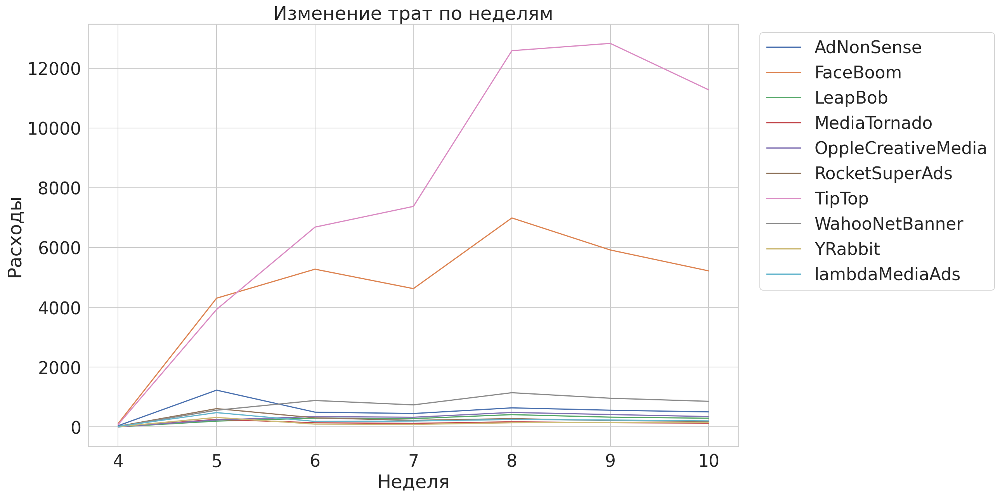

In [46]:
# визуализация изменений трат по неделям
costs.pivot_table(
    index='month',  # даты 
    columns='channel',  # источники переходов
    values='costs',  
    aggfunc='sum',  
).plot(figsize=(15, 10), grid=True)

plt.title('Изменение трат по неделям')
plt.xlabel('Неделя')
plt.ylabel('Расходы')
plt.legend(bbox_to_anchor=(1.02, 1.0), loc='best')
plt.show()

Самые большие инвестиции в каналы TipTop и FaceBoom.


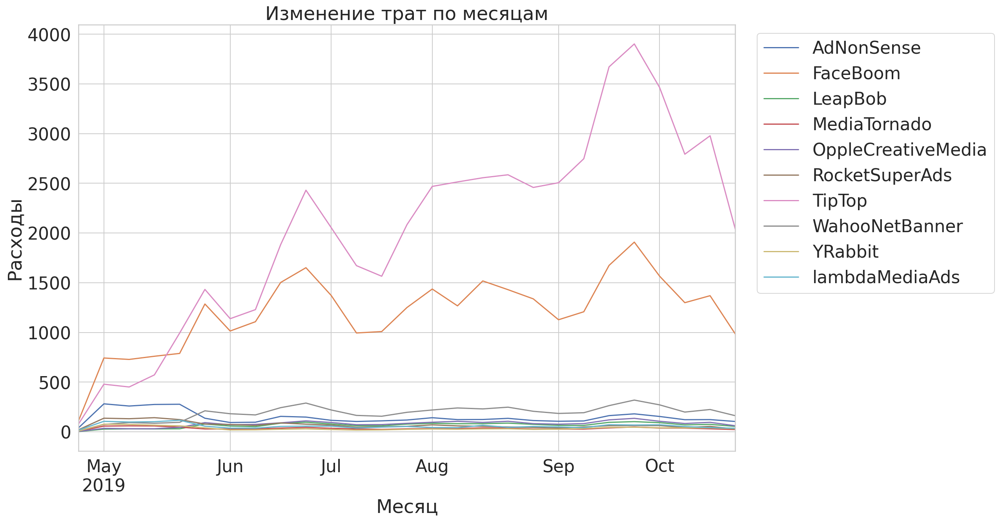

In [47]:
# визуализация изменений трат по месяцам
costs.pivot_table(
    index='dt',  # даты 
    columns='channel',  # источники переходов
    values='costs',  
    aggfunc='sum',  
).plot(figsize=(15, 10), grid=True)

plt.title('Изменение трат по месяцам')
plt.xlabel('Месяц')
plt.ylabel('Расходы')
plt.legend(bbox_to_anchor=(1.02, 1.0), loc='best')
plt.show()

По месяцам, также TipTop и FaceBoom самые затратные каналы.

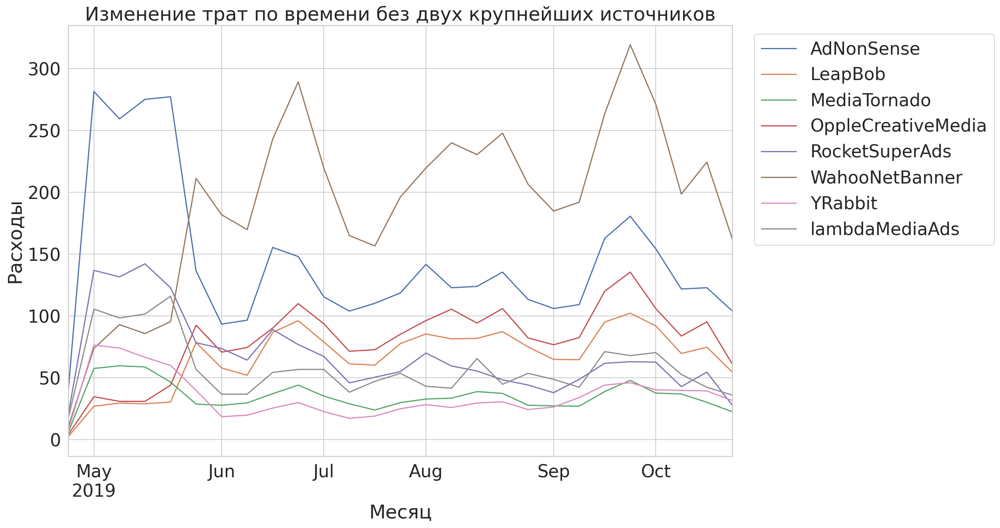

In [48]:
costs2 = costs[(costs.channel != 'FaceBoom') & (costs.channel != 'TipTop')]
costs2.pivot_table(
    index='dt',  # даты 
    columns='channel',  # источники переходов
    values='costs',  
    aggfunc='sum',  
).plot(figsize=(15, 10), grid=True)

plt.title('Изменение трат по времени без двух крупнейших источников')
plt.xlabel('Месяц')
plt.ylabel('Расходы')
plt.legend(bbox_to_anchor=(1.02, 1.0), loc='best')
plt.show()

#### Вывод

Общая сумма расходов на маркетинг составила 105497.3. Наибольше расходы на канал TipTop - 54 751,3 ед. и FaceBoom - 32 445,6 ед. 

Расходы на остальные каналы значительно ниже. На третьем месте - WahooNetBanner с 5 151. Последние места занимают канал YRabbit - 944,22 и MediaTornado - 954,48. Каждый месяц с мая по сентябрь расходы на маркетинг росли. График изменения расходов по времени показал, что траты на TipTop возрастали с каждым месяцем. Траты на FaceBoom росли гораздо медленнее. Все остальные источники существенно уступают по объему расходов на маркетинг.

Стоимость привлечения органических пользователей во всех когортах, распределенных по каналам, равна нулю, потому что они не были привлечены за счет рекламы. Привлечение одного пользователя из канал TipTop обошлось компании в среднем в 2,76, из FaceBoom - 1,11, из AdNonSense - 1,01. 

Если по большинству каналов расходы на протяжении всего времени были примерно равномерными, то TipTop на их фоне значительно выделяется, т.к. расходы на одного пользователя росли почти каждый месяц. Средний CAC по всему проекту составил 0,7.

### Оцените окупаемость рекламы

Используя графики LTV, ROI и CAC, проанализируйте окупаемость рекламы. Считайте, что на календаре 1 ноября 2019 года, а в бизнес-плане заложено, что пользователи должны окупаться не позднее чем через две недели после привлечения. Необходимость включения в анализ органических пользователей определите самостоятельно.

- Проанализируйте окупаемость рекламы c помощью графиков LTV и ROI, а также графики динамики LTV, CAC и ROI.
- Проверьте конверсию пользователей и динамику её изменения. То же самое сделайте с удержанием пользователей. Постройте и изучите графики конверсии и удержания.
- Проанализируйте окупаемость рекламы с разбивкой по устройствам. Постройте графики LTV и ROI, а также графики динамики LTV, CAC и ROI.
- Проанализируйте окупаемость рекламы с разбивкой по странам. Постройте графики LTV и ROI, а также графики динамики LTV, CAC и ROI.
- Проанализируйте окупаемость рекламы с разбивкой по рекламным каналам. Постройте графики LTV и ROI, а также графики динамики LTV, CAC и ROI.
- Ответьте на такие вопросы:
    - Окупается ли реклама, направленная на привлечение пользователей в целом?
    - Какие устройства, страны и рекламные каналы могут оказывать негативное влияние на окупаемость рекламы?
    - Чем могут быть вызваны проблемы окупаемости?

Напишите вывод, опишите возможные причины обнаруженных проблем и промежуточные рекомендации для рекламного отдела.

In [49]:
# исключение органических пользователей из таблицы
profiles = profiles.query('channel != "organic"')

In [50]:
# функция для сглаживания фрейма
def filter_data(df, window):
    # для каждого столбца применяем скользящее среднее
    for column in df.columns.values:
        df[column] = df[column].rolling(window).mean() 
    return df 

In [51]:
# функция для визуализации LTV и ROI
def plot_ltv_roi(ltv, ltv_history, roi, roi_history, horizon, window=7):

    # задаём сетку отрисовки графиков
    plt.figure(figsize=(30, 15))

    # из таблицы ltv исключаем размеры когорт
    ltv = ltv.drop(columns=['cohort_size'])
    # в таблице динамики ltv оставляем только нужный лайфтайм
    ltv_history = ltv_history.drop(columns=['cohort_size'])[[horizon - 1]]

    # стоимость привлечения запишем в отдельный фрейм
    cac_history = roi_history[['cac']]

    # из таблицы roi исключаем размеры когорт и cac
    roi = roi.drop(columns=['cohort_size', 'cac'])
    # в таблице динамики roi оставляем только нужный лайфтайм
    roi_history = roi_history.drop(columns=['cohort_size', 'cac'])[
        [horizon - 1]
    ]

    # первый график — кривые ltv
    ax1 = plt.subplot(2, 3, 1)
    ltv.T.plot(grid=True, ax=ax1)
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('LTV', fontsize=25)

    # второй график — динамика ltv
    ax2 = plt.subplot(2, 3, 2, sharey=ax1)
    # столбцами сводной таблицы станут все столбцы индекса, кроме даты
    columns = [name for name in ltv_history.index.names if name not in ['dt']]
    filtered_data = ltv_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax2)
    plt.xlabel('Дата привлечения')
    plt.title('Динамика LTV пользователей на {}-й день'.format(horizon), fontsize=25)

    # третий график — динамика cac
    ax3 = plt.subplot(2, 3, 3, sharey=ax1)
    # столбцами сводной таблицы станут все столбцы индекса, кроме даты
    columns = [name for name in cac_history.index.names if name not in ['dt']]
    filtered_data = cac_history.pivot_table(
        index='dt', columns=columns, values='cac', aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax3)
    plt.xlabel('Дата привлечения')
    plt.title('Динамика стоимости привлечения пользователей', fontsize=25)


    # четвёртый график — кривые roi
    ax4 = plt.subplot(2, 3, 4)
    roi.T.plot(grid=True, ax=ax4)
    plt.axhline(y=1, color='red', linestyle='--', label='Уровень окупаемости')
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('ROI', fontsize=25)

    # пятый график — динамика roi
    ax5 = plt.subplot(2, 3, 5, sharey=ax4)
    # столбцами сводной таблицы станут все столбцы индекса, кроме даты
    columns = [name for name in roi_history.index.names if name not in ['dt']]
    filtered_data = roi_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax5)
    plt.axhline(y=1, color='red', linestyle='--', label='Уровень окупаемости')
    plt.xlabel('Дата привлечения')
    plt.title('Динамика ROI пользователей на {}-й день'.format(horizon), fontsize=25)
    
    plt.tight_layout()
    plt.show()

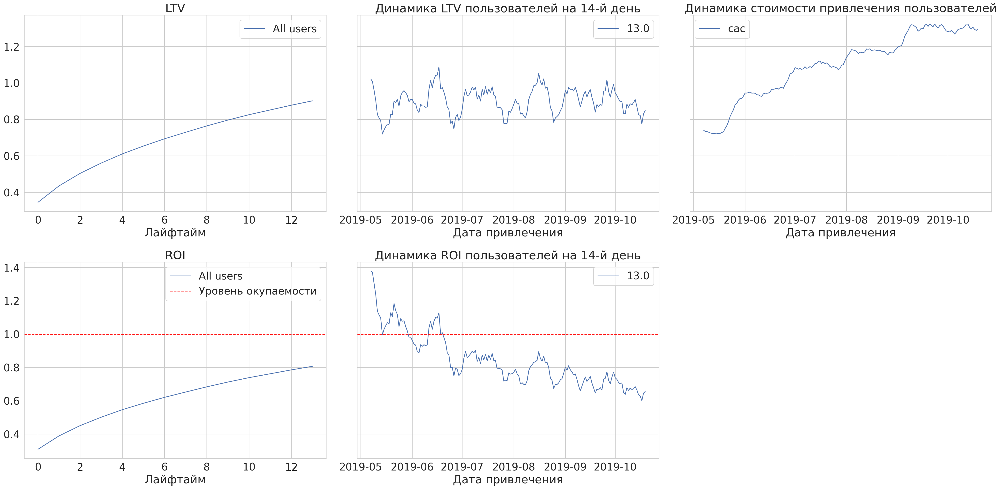

In [52]:
# считаем LTV и ROI
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles, orders, observation_date, horizon_days)

# строим графики
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days) 

Из графиков можно сделать вывод, что ROI находится ниже уровня окупаемости. Динамика ROI пользователей на 14-й день падает все больше со временем. Динамика стоимости привлечения пользователей постепенно увеличивалась. LTV достаточно стабильно растет.

#### Анализ окупаемости рекламы с разбивкой по устройствам

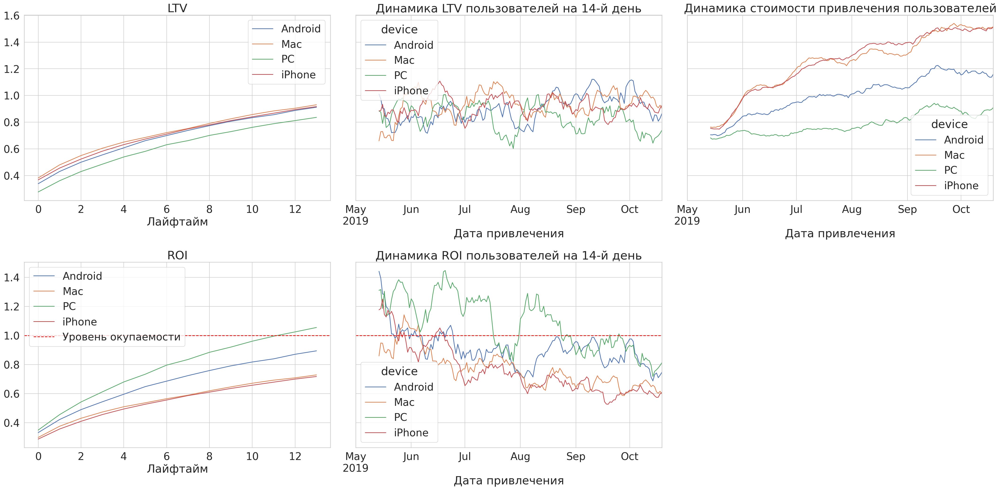

In [53]:
dimensions = ['device']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14
) 

Пользователи PC окупаются, в отличие от Android, Mac и iPhone. Динамика стоимости привлечения клиентов показывает, что наименьшие расходы были как раз в отношении пользователей PC. На графике заметно снижение динамики ROI у всех устройств при росте стоимости привлечения пользователей.

#### Анализ окупаемости рекламы с разбивкой по странам

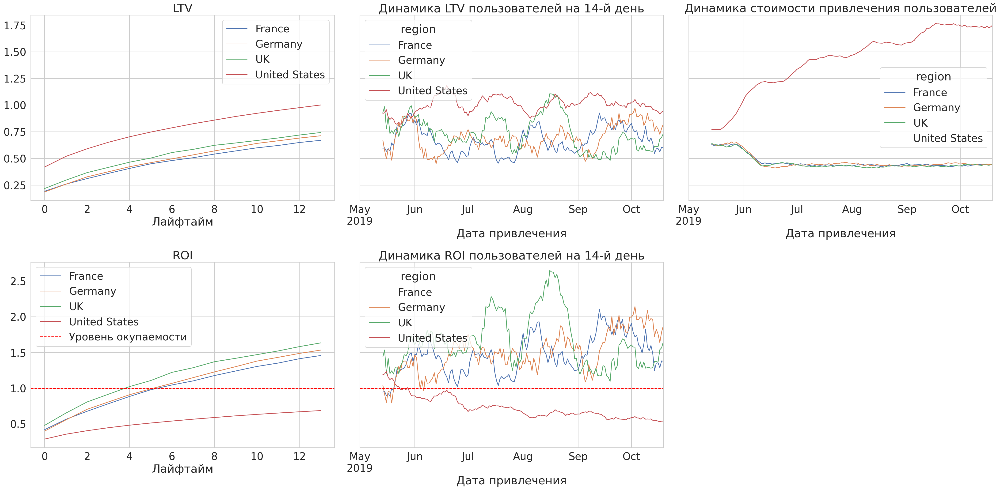

In [54]:
dimensions = ['region']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14
) 

Реклама не окупилась только в США из 4 стран. Динамика стоимости привлечения пользователей показывает огромный разрыв расходов в США по сравнению с другими странами, стоимость в США существенно выше. Динамика ROI показывает снижение окупаемости на пользователя из США ниже уровня безубыточности. Динамика LTV подвержена сезонности и стабильна. LTV в США выше, чем в других странах.

#### Анализ окупаемости рекламы с разбивкой по рекламным каналам

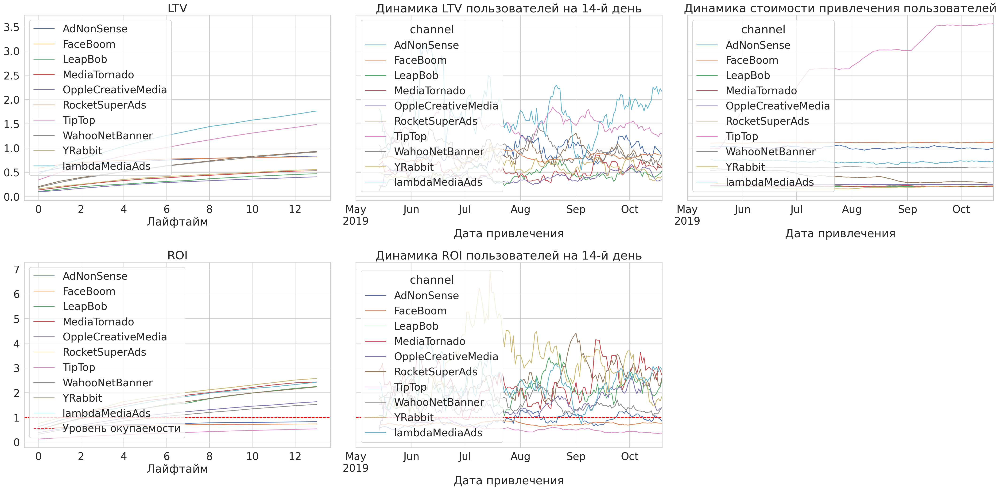

In [55]:
dimensions = ['channel']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14
) 

Динамика стоимости привлечения пользователей наиболее высокая у канала TipTop. Но эти расходы не   окупились. У остальных динамика стабильная. Из 10 каналов только 3 находятся ниже уровня окупаемости - TipTop, FaceBoom, AdNonSence.

#### Окупаемость рекламы с разбивкой по устройствам и рекламным каналам пользователей из США

In [56]:
# исключение из таблицы всех стран, кроме США
profiles_USA = profiles.query('region == "United States"')

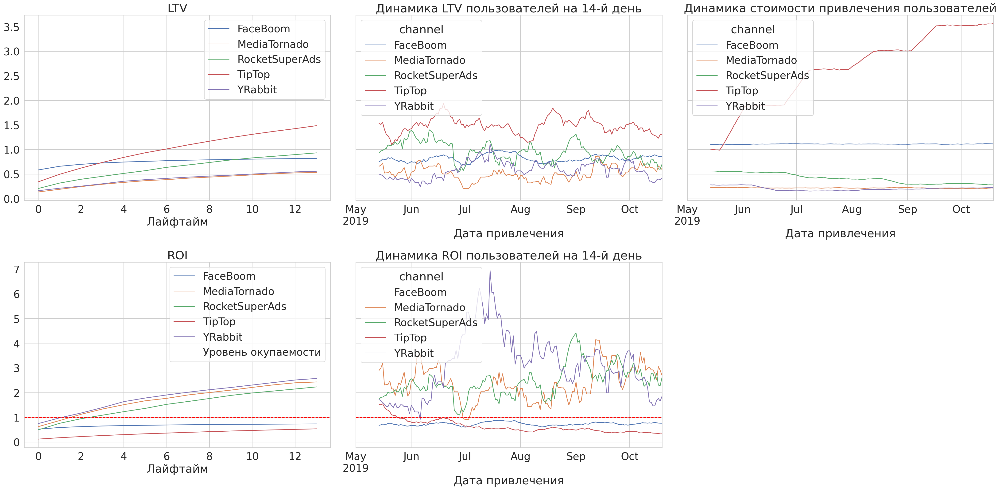

In [57]:
# смотрим окупаемость с разбивкой по источникам привлечения
dimensions = ['channel']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles_USA, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14
) 

В США динамика стоимости привлечения пользователей через TipTop была значительно выше, чем у других каналов, но расходы на рекламу не окупились.

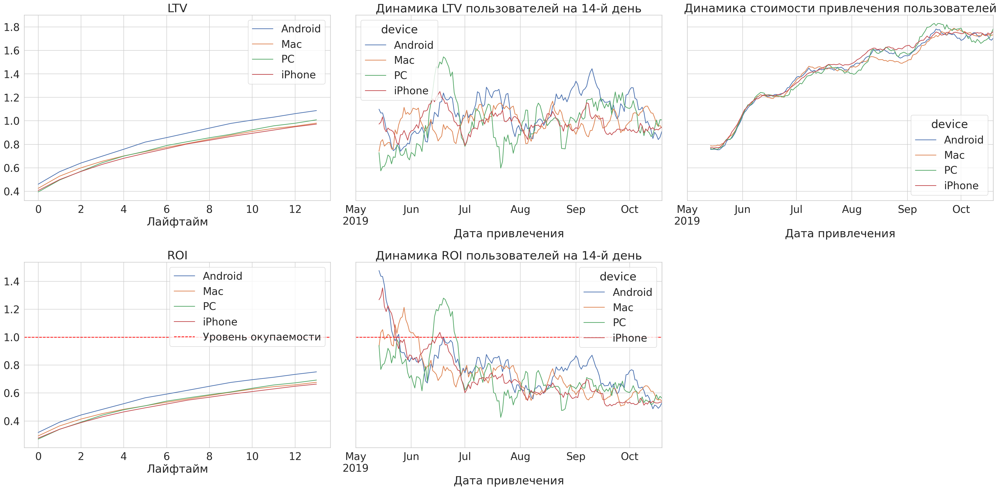

In [58]:
dimensions = ['device']

ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles_USA, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14
) 

В США динамика стоимости привлечения пользователей была практически одинаковой для всех устройств. Ни одно устройство не окупилось.

#### Создание и изучение графиков конверсии и удержания с разбивкой по устройствам, странам, рекламным каналам

In [59]:
#Функция для визуализации конверсии

def plot_conversion(conversion, conversion_history, horizon, window=7):

    # задаём размер сетки для графиков
    plt.figure(figsize=(30, 10))

    # исключаем размеры когорт
    conversion = conversion.drop(columns=['cohort_size'])
    # в таблице динамики оставляем только нужный лайфтайм
    conversion_history = conversion_history.drop(columns=['cohort_size'])[
        [horizon - 1]
    ]

    # первый график — кривые конверсии
    ax1 = plt.subplot(1, 2, 1)
    conversion.T.plot(grid=True, ax=ax1)
    plt.legend()#bbox_to_anchor=(1.0, 1.05), loc='upper left')
    plt.xlabel('Лайфтайм')
    plt.title('Конверсия пользователей')

    # второй график — динамика конверсии
    ax2 = plt.subplot(1, 2, 2, sharey=ax1)
    columns = [
        # столбцами сводной таблицы станут все столбцы индекса, кроме даты
        name for name in conversion_history.index.names if name not in ['dt']
    ]
    filtered_data = conversion_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax2)
    plt.xlabel('Дата привлечения')
    plt.title('Динамика конверсии пользователей на {}-й день'.format(horizon))

    plt.tight_layout()
    plt.show()

In [60]:
# Функция для визуализации удержания

def plot_retention(retention, retention_history, horizon, window=7):

    # задаём размер сетки для графиков
    plt.figure(figsize=(30, 20))

    # исключаем размеры когорт и удержание первого дня
    retention = retention.drop(columns=['cohort_size', 0])
    # в таблице динамики оставляем только нужный лайфтайм
    retention_history = retention_history.drop(columns=['cohort_size'])[
        [horizon - 1]
    ]

    # если в индексах таблицы удержания только payer,
    # добавляем второй признак — cohort
    if retention.index.nlevels == 1:
        retention['cohort'] = 'All users'
        retention = retention.reset_index().set_index(['cohort', 'payer'])

    # в таблице графиков — два столбца и две строки, четыре ячейки
    # в первой строим кривые удержания платящих пользователей
    ax1 = plt.subplot(2, 2, 1)
    retention.query('payer == True').droplevel('payer').T.plot(
        grid=True, ax=ax1
    )
    plt.legend()
    plt.xlabel('Лайфтайм')
    plt.title('Удержание платящих пользователей')

    # в третьей ячейке — динамика удержания платящих
    ax2 = plt.subplot(2, 2, 2, sharey=ax1)
    # получаем названия столбцов для сводной таблицы
    columns = [
        name
        for name in retention_history.index.names
        if name not in ['dt', 'payer']
    ]
    # фильтруем данные и строим график
    filtered_data = retention_history.query('payer == True').pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax2)
    plt.xlabel('Дата привлечения')
    plt.title(
        'Динамика удержания платящих пользователей на {}-й день'.format(
            horizon
        )
    )
    
    plt.tight_layout()
    plt.show() 

#### Анализ с разбивкой по устройствам

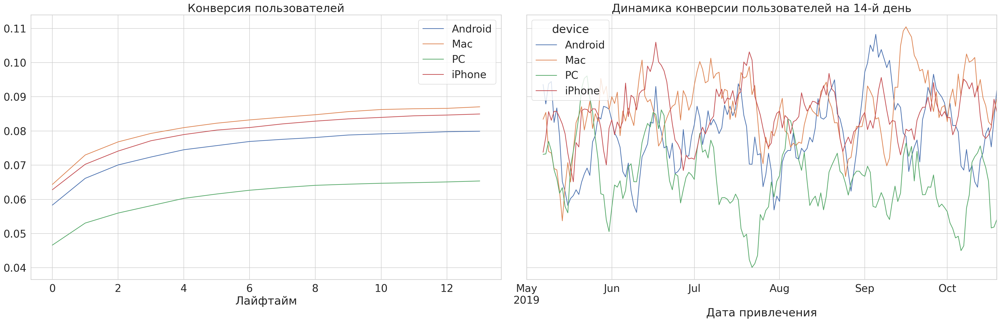

In [61]:
# конверсия с разбивкой по устройствам
dimensions = ['device']
conversion_raw, conversion_grouped, conversion_history = get_conversion(
    profiles, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_conversion(conversion_grouped, conversion_history, horizon_days)

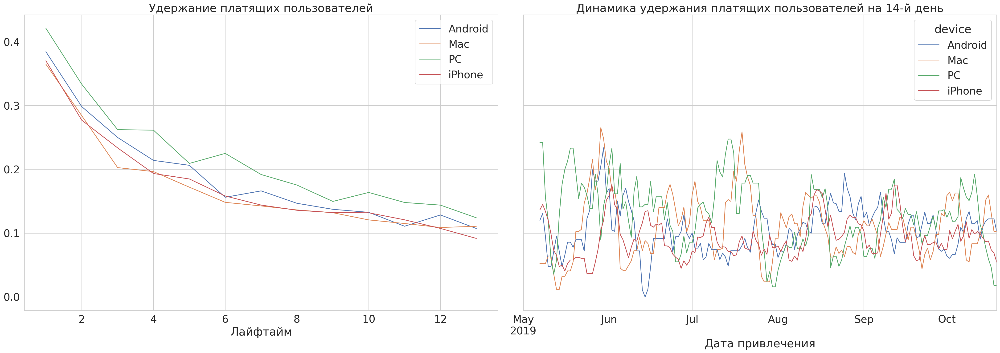

In [62]:
# удержание с разбивкой по устройствам
dimensions = ['device']
retention_raw, retention_grouped, retention_history = get_retention(
    profiles, visits, observation_date, horizon_days, dimensions=dimensions
)

plot_retention(retention_grouped, retention_history, horizon_days)

Mac и iPhone конвертируются лучше остальных устройств, PC отстает. При этом по удержанию PC показал чуть более лучшие результаты.

#### Анализ с разбивкой по регионам

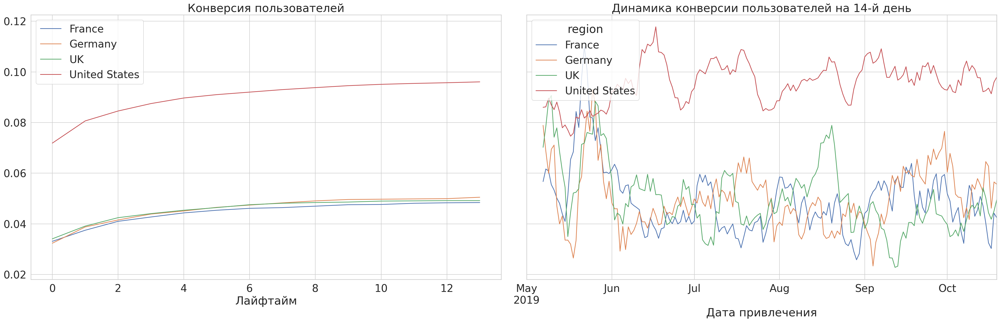

In [63]:
# конверсия с разбивкой по регионам
dimensions = ['region']
conversion_raw, conversion_grouped, conversion_history = get_conversion(
    profiles, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_conversion(conversion_grouped, conversion_history, horizon_days)

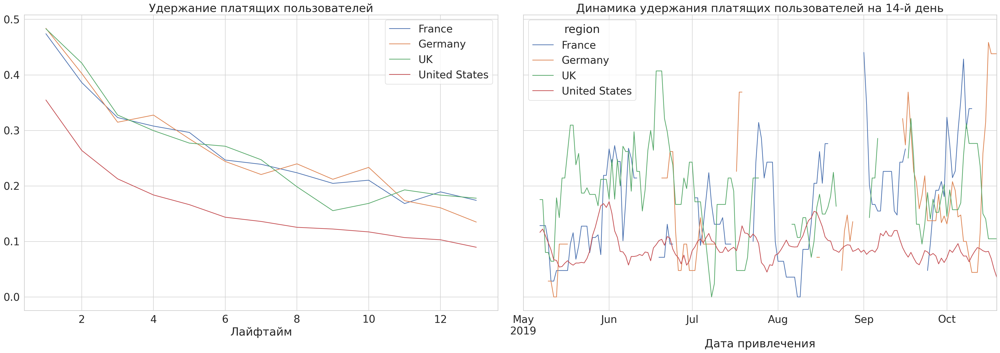

In [64]:
# удержание с разбивкой по регионам
dimensions = ['region']
retention_raw, retention_grouped, retention_history = get_retention(
    profiles, visits, observation_date, horizon_days, dimensions=dimensions
)

plot_retention(retention_grouped, retention_history, horizon_days)

С разбивкой по регионам США примерно в 2 раза опережают по конверсии, но проигрывают по удержанию.

#### Анализ с разбивкой по каналам

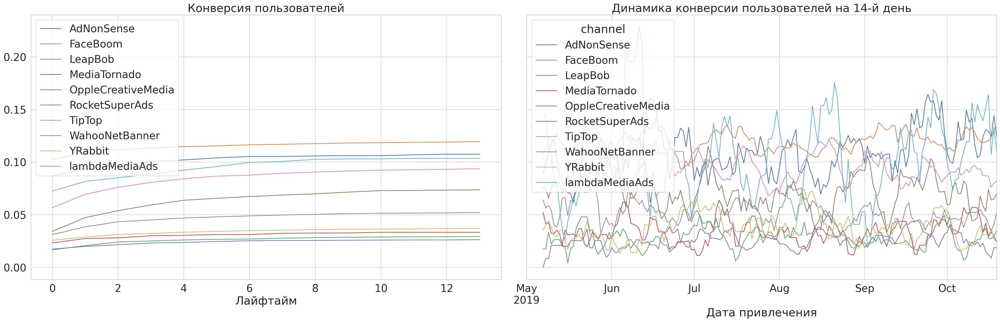

In [65]:
# конверсия с разбивкой по каналам
dimensions = ['channel']

conversion_raw, conversion_grouped, conversion_history = get_conversion(
    profiles, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_conversion(conversion_grouped, conversion_history, horizon_days) 

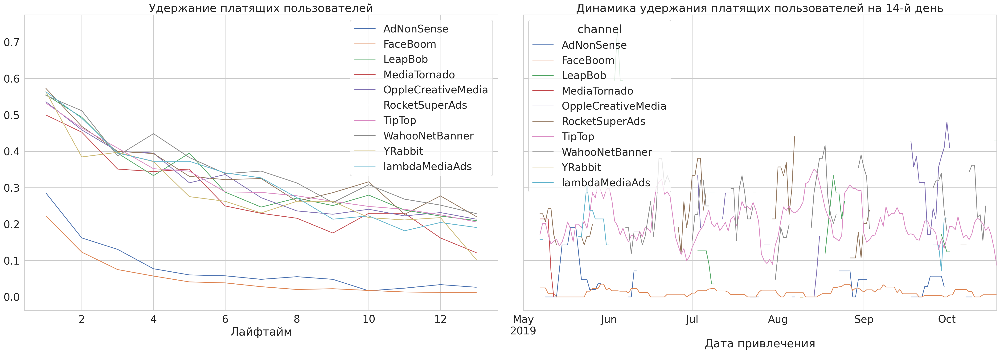

In [66]:
# удержание с разбивкой по каналам  
dimensions = ['channel']
retention_raw, retention_grouped, retention_history = get_retention(
    profiles, visits, observation_date, horizon_days, dimensions=dimensions
)

plot_retention(retention_grouped, retention_history, horizon_days) 

#### Анализ причин неокупаемости рекламы

Начнем с региона. Несмотря на то, что конверсия пользователей из США самая высокая, у них самое плохое удержание и ROI. По источникам - явный аутсайдер TipTop.

Посмотрим на графики LTV и ROI без США:

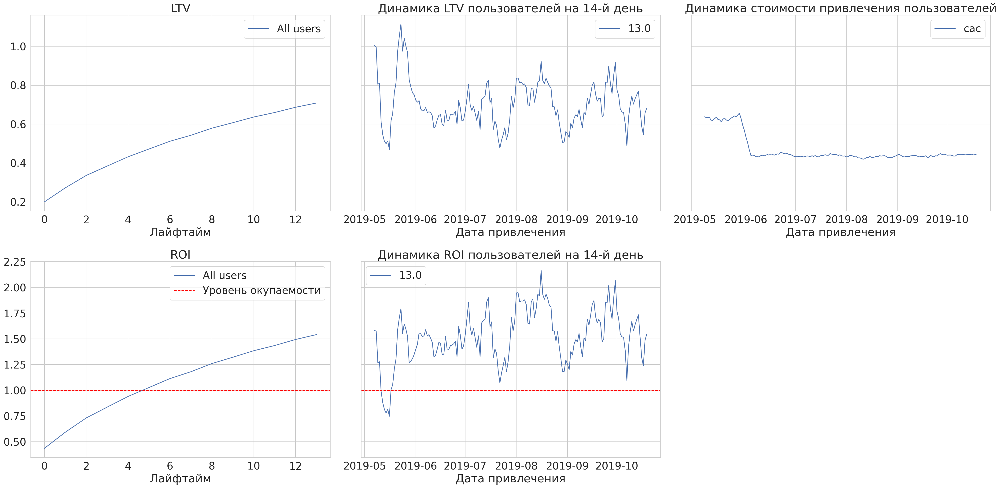

In [67]:
# дата наблюдения - 01.11.2019
observation_date = datetime(2019, 11, 1).date()
# горизонт анализа данных - 14 дней, потому что в бизнес-плане заложено, 
# что пользователи должны окупаться не позднее чем через две недели после привлечения
horizon_days = 14

# получим сырые данные об ltv, roi - общую без разделения на когорты и в динамике
# исключаем США
ltv_raw, ltv_grouped, ltv_in_time, roi_grouped, roi_in_time = get_ltv(profiles.query('region != "United States"'), orders, observation_date, horizon_days)

# строим 4 графика по полученным данным, сглаживаем их скользящим средним с размером окна 7
plot_ltv_roi(ltv_grouped, ltv_in_time, roi_grouped, roi_in_time, horizon_days, window=7)

С разбивкой по каналам хуже всех удерживаются пользоватеи из FaceBoom, при этом опережая остальных по конверсии. Также одним из худших по удержанию оказался рекламный источник AdNonSense.

Затем, посмотрим без канала TipTop:

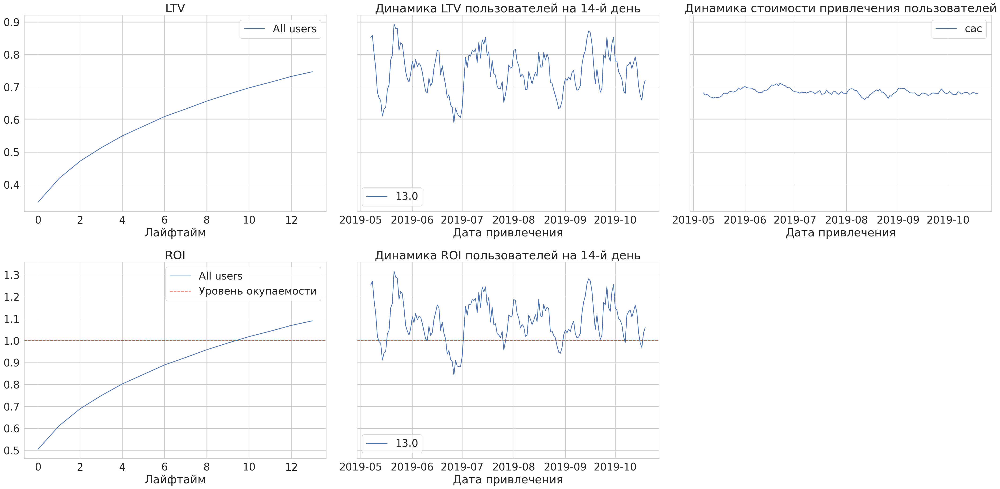

In [68]:
 # дата наблюдения - 01.11.2019
observation_date = datetime(2019, 11, 1).date()
# горизонт анализа данных - 14 дней, потому что в бизнес-плане заложено, 
# что пользователи должны окупаться не позднее чем через две недели после привлечения
horizon_days = 14

# получим сырые данные об ltv, roi - общую без разделения на когорты и в динамике
# исключаем США
ltv_raw, ltv_grouped, ltv_in_time, roi_grouped, roi_in_time = get_ltv(profiles.query('channel != "TipTop"'), orders, observation_date, horizon_days)

# строим 4 графика по полученным данным, сглаживаем их скользящим средним с размером окна 7
plot_ltv_roi(ltv_grouped, ltv_in_time, roi_grouped, roi_in_time, horizon_days, window=7) 

Теперь графики выглядят хорошо. Значит, платящие пользователи из США, как и пользователи из канала TipTop не дают окупиться инвестициям в рекламу.

Попробуем найти причину этого. Посмотрим на среднюю продолжительность сессии пользователей из США и из других стран:

In [69]:
# добавляем в таблицу с посещениями продолжительность сессии
visits['duration'] = (visits['session_end'] - visits['session_start']).dt.seconds

# посмотрим на описание распределения длительности сессий по странам
# исключим канал organic, потому что с точки зрения потерь в маркетинге он нам не интересен
visits.query('channel != "organic"').groupby('region')['duration'].describe()

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
France,23332.0,1777.856335,1777.502398,0.0,515.0,1224.0,2486.00,19249.0
Germany,20240.0,1780.226779,1762.710591,0.0,518.0,1238.0,2480.00,17743.0
UK,24098.0,1787.255955,1786.840168,0.0,515.0,1246.0,2459.75,19637.0
United States,134471.0,1807.702969,1815.000793,0.0,522.0,1247.0,2502.00,22257.0


Вывод:

- средняя длительность сессии в США больше на 20-30 секунд, чем в других странах;
- максимальная длительность сессии сильно больше, чем в других странах;
- стандартное отклонение больше на 30 секунд.

Таким образом, в США пользователи дольше работают с приложением. Может быть, это связано с работой самого приложения или целевой аудиторией, на которую оно расчитано. Возможно, пользователи больше покупают в приложении, ведь онверсия в США больше других стран.

Эту информацию необходимо обсудить с заказчиком исследования.

#### Вывод

В целом, окупаемость рекламы со временем падает, а стоимость привлечения пользователей растет. В рассматриваемый период реклама в итоге не окупилась.

Из всех стран, США оказались единственной c убытками по ROI. Возрастающие расходы на привлечение клиентов не оправдались.

В срезе по устройствам выявлено снижение динамики окупаемости к 14 дню у всех девайсов при росте стоимости привлечения пользователей. Mac и iPhone, а также Android показали результаты ниже уровня окупаемости, при этом у них же выявлены наибольшие расходы на привлечение. В США пользователи всех устройств не принесли достаточно денег, чтобы реклама на них окупилась.

Высокие расходы обнаружены на канал TipTop, который в результате не показал положительных результатов по ROI.

### Выводы и рекомендации для отдела маркетинга

<div style="border:solid green 2px; padding: 20px">
    
**Выводы**
    
Для анализа в нашем распоряжении было 3 файла с информацией о посещении сайта, покупках и расходах на рекламу. Пропусков данных нет, типы данных в каждой таблице соотвутствуют содержимому.

Мы привели имена столбцов к нужному стилю, поискали дубликаты - их не оказалось. Пропущенных значений тоже нет. Тип данных для дат преобразовали на этапе формирования датафреймов из csv-файлов.

Отдельно задали фукнкции для для расчета и анализа LTV, ROI, удержания и конверсии.

**Исследовательский анализ данных:**

- в нашем рапоряжении данные о пользователях, которых привлекали в период с 01.05.2019 по 27.10.2019;
- каждый клиент приносит в среднем от $4.99 до $149.9;
- все пользователи из 4 стран: США, Германия, Франция, Великобритания. Большинство пользователей, в том числе платящих - из США (100002 человек и 6.9% платящих), меньше всего пользователей из Германии, а платящих - из Франции;
- пользователи заходят на сайт, используя Mac, iPhone, Android и PC. Больше всего пользователей заходят с iPhone - 54479, больше всего платящих заходят через Mac - 6.4%;
- по источникам привлечения - всего 11 источников - больше всего органических (56439 человек), но они платят меньше всего (доля - 2%). Больше всего платящих приходят с канала FaceBoom (в абсолютных и относительных - 12.2%) и TipTop (в абсолютных значениях).

**Маркетинговый анализ:**

- общие расходы на маркетинг за исследуемый период - 105497;
- в среднем дороже всего обошлось привлечение пользователей из источника TipTop (2.8), дешевле всего - LeapBob (0.2), organic - бесплатные привлечения;
- cредний CAC на одного пользователя для всего проекта = 1.13;
- динамика CAC по каналам привлечения показывает рост только по источнику TipTop: стоимость привлечения пользователя росла ступенчато от 1 до 3.5 с 05.05.2019 по 27.10.2019.

**Оценка покупаемости рекламы:**

Общая окупаемость:

- вся прибыль от клиентов на периоде горизонта анализа растет;
- динамика LTV пользователей стабильна и колеблется около 0.7;
- динамика стоимости привлечения пользователей резко растет с июня вплоть до конца наблюдения;
- реклама не окупается, несмотря на увеличение рекламного бюджета, на 14-й день только приближается к 100%;
- динамика ROI практически обратно пропорциональна динамике стоимости привлечения пользователей: чем больше средств тратится на привлечение, тем сложнее ей окупиться.

**По каналам привлечения:**

- реклама не окупается по 3 каналам: TipTop, FaceBoom, AdNonSence;
- хуже всего дела у TipTop;
- динамика стоимости привлечения пользователей ежемесячно растет у источника TipTop, что подтвержают расчеты CAC;
- LTV растет медленно по всем источникам, лучше всего у lambdaMediaAds, TipTop. Стабильно высокие - AdNonSence, FaceBoom;
- сильнее всего динамика ROI менялась у YRabbit, но к концу исследуемого периода стабилизируется в районе границы окупаемости. Самая низкая динамика ROI - TipTop.

**По странам:**

- реклама не окупается в США;
- стоимость привлечения в США резко возрастает, начиная с июня;
- динамика окупаемости стабилизируется к октябрю в районе 150-170% (в США около 60%);
- для пользователей из США также самый высокий LTV и его динамика.

**Промежуточный вывод:**

- стоимость привлечения по каналу TipTop самая высокая к концу исследуемого периода, но по этому источнику затраты не окупаются;
- стоимость привлечения пользователей из США также самая высокая, окупаемость самая низкая (на 14-й день около 60%).

Графики CAC и ROI по этим критериям (канал TipTop и регион USA) схожи с графиками CAC и ROI рекламы в общем. Вероятно, эти критерии сильно влияют на общую картину стоимости привлечения пользователей и окупаемости рекламы.

**Выводы по графикам конверсии и удержания:**

по устройствам:
    
- пользователи Mac и iPhone конвертируются очень хорошо, причём постоянно. Хуже всего - PC.
- платящие пользователи стабильно плохо удерживаются (к концу 14 дня ниже 20%), неплатящие - еще хуже (к концу 14 дня ниже 2%).

по странам:
    
- конверсия пользователей из США самая высокая, причем она была выше всех на протяжении всего периода исследования. Но удержание платящих пользователей самое низкое - к концу 5 дня 20%.

по каналам:
    
- самое плохое удержание - удержание платящих пользователей по каналам Faceboom (меньше 5%). При этом по Faceboom самая высокая конверсия.

**Анализ возможных причин неокупаемости рекламы:**

- средняя длительность сессии в США больше на 20-30 секунд, чем в других странах;
- максимальная длительность сессии сильно больше, чем в других странах;
- стандартное отклонение больше на 30 секунд.

В США пользователи дольше работают с приложением. Может быть, это связано с работой самого приложения или целевой аудиторией, на которую оно расчитано. А возможно, это связано с тем, что пользователи больше покупают в приложении (конверсия в США больше других стран). Эту информацию необходимо обсудить с заказчиком исследования.

**Общий вывод и рекомендации:**

1. Причины неэффективности привлечения пользователей:

Большие инвестиции в каналы TipTop, FaceBoom и AdNonSence, которые себя не оправдывают. Возможно, неверно настроена реклама, неправильно описана целевая аудитория. Возможно некорректная работа приложения для клиентов в США.


2. Рекомендации для отдела маркетинга.

- Проанализировать причины низкого количества платящих пользователей в странах Европы, посмотреть воронку. В перспективе данные регионы могут принести прибыль. Уделить больше внимания инвестициям в данные регионы, т.к. США показывают плохие результаты.
- Перераспределить рекламный бюджет на другие каналы, т.к. самые популярные `TipTop`, `FaceBoom` и `AdNonSence` показывают себя плохо, насмотря на большое количество пользователей. В перспективе другие каналы могут принести больше платящих пользователей.
- Cтоимость привлечения пользователей из США самая высокая, окупаемость самая низкая (на 14-й день около 60%). Необходимо проанализировать целевую аудиторию и корректность работы приложения у пользователей из США. 
- Обратить внимание на Францию, Германию и Британию. Перспективный канал RocketSuperAds, который обходится дешевле всего, с хорошей конверсией и удержанием. А также на европейских пользователей Mac и iPhone, у которых хорошая конверсия.